# Using Tabula Sapiens as a reference for annotating new datasets

In [1]:
import os, sys

sys.path.insert(0, '../../PopV')
sys.path.insert(0, '../../tabula_sapiens/bbknn')
sys.path.insert(0, '../../tabula_sapiens/celltypist')

In [2]:
import celltypist
celltypist.__file__

'/data/extra_files/galen_dropbox_figures/can_reproducibility/lung_models/lung_annotation/../../tabula_sapiens/celltypist/celltypist/__init__.py'

In [3]:
import popv
import anndata
import numpy as np
import scanpy as sc
from scanpy.plotting import palettes
sys.path.insert(-1, '../..')
import _utils


Created a temporary directory at /tmp/tmp0x5qg7zu
Writing /tmp/tmp0x5qg7zu/_remote_module_non_scriptable.py
2023-08-12 01:40:58.125417: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
From /home/cane/miniconda3/envs/test_popv_new/lib/python3.10/site-packages/tensorflow/python/compat/v2_compat.py:107: disable_resource_variables (from tensorflow.python.ops.variable_scope) is deprecated and will be removed in a future version.
Instructions for updating:
non-resource variables are not supported in the long term


# Step 2: Load your data (User Action Required)
Here we provide three options to load your data:
1. Connect to Google Drive (highly recommended)
2. Download your data from the cloud and save into this session or on Google drive.
3. Upload your data manually into this session (files are not persistent and will be deleted when session is closed)

As an example, we use a subsampled version of the [Lung Cell Atlas](https://hlca.ds.czbiohub.org/) \[1] for our query data.

\[1] Travaglini, K. et al. A molecular cell atlas of the human lung from single-cell RNA sequencing. *Nature* **587**, 619–625(2020).

In [4]:
query_adata = sc.read('lung_query_construction/LCA.h5ad')
query_adata.obs_names_make_unique()
query_adata.var_names = query_adata.var_names.str.upper()
query_adata = query_adata[~query_adata.obs['sample'].str.contains("blood")].copy()
# query_adata = query_adata[np.random.choice(query_adata.obs_names, 1000, replace=False)]

In [5]:
del query_adata.uns
del query_adata.var
del query_adata.raw

# Step 3 (User Action Required): Setting Up Annotation Parameters 

Here is where you set the parameters for the automated annotation.

Arguments:
- **tissue:** Tabula Sapiens tissue to annotate your data with. Available tissues: ["Bladder", "Blood", "Bone_Marrow", "Kidney", "Large_Intestine", "Lung","Lymph_Node", "Pancreas", "Small_Intestine", "Spleen", "Thymus","Trachea", "Vasculature"]
- **save_location:** location to save results to. By default will save to a folder named `annotation_results`. It is highly recommended you provide a Google Drive folder here.
- **query_batch_key:** key in `query_adata.obs` for batch correction. Set to None for no batch correction. 
- **algorithms:** these are the methods to run. By default, will run all methods.
Options: ["knn_on_scvi_pred", "scanvi_pred", "knn_on_bbknn_pred", "svm_pred", "rf_pred", "onclass_pred", "knn_on_scanorama_pred",


Lesser used parameters
- **query_labels_key**: scANVI has the option to use labeled cells in the query dataset during training. To use some prelabeled cells from the query dataset, set `query_labels_key` to the corresponding key in `query_adata.obs`
- **unknown_celltype_label**: If `query_labels_key` is not None, will treat everything not labeled `unknown_celltype_label` as a labeled cell

In [6]:
""" 
tissue options: 
['Bladder','Blood','Bone_Marrow','Fat',
'Heart','Kidney','Large_Intestine','Liver',
'Lung','Lymph_Node','Mammary','Muscle',
'Pancreas','Prostate','Salivary Gland',
'Skin','Small_Intestine','Spleen',
'Thymus','Trachea','Vasculature']
"""
output_folder = 'annotation'
tissue = 'Lung'
save_folder = f'{output_folder}/popv_results'

query_batch_key = 'donor_assay'

# Lesser used parameters
query_labels_key=None
unknown_celltype_label='unknown'

# Step 4: Downloading Reference Data and Pretrained Models
No more user input required! Just run all the following code blocks.

**NOTE: PopV has only been evaluated with the Lung/Thymus/Lymph_Node as a reference dataset. Different tissues have different annotation quality and the Tabula sapiens community is currently actively improving the annotation quality. We strongly expect improvement of cell annotation when the updated annotation is released. Upon release the Zenodo repository will be updated.**

In [7]:
import requests
res = requests.get("https://zenodo.org/api/records/7587774")
tissue_download_path = {ind['key'][3:-14]:ind['links']['self'] for ind in res.json()['files']}

In [8]:
refdata_url = tissue_download_path[tissue]
output_fn = f'{output_folder}/TS_{tissue}.h5ad'
if not os.path.exists(output_fn):
    !wget -O $output_fn $refdata_url

In [9]:
output_fn = f'{output_folder}/TS_{tissue}.h5ad'
# read in the reference dataset
ref_adata = sc.read_h5ad(output_fn)
# ref_adata = ref_adata[np.random.choice(ref_adata.obs_names, 5000, replace=False)]

In [10]:
ref_adata.obs['cell_ontology_class'] = ref_adata.obs['cell_ontology_class'].astype(str)
ref_adata.obs.loc[ref_adata.obs['free_annotation']=='capillary aerocyte', 'cell_ontology_class'] = 'alveolar capillary type 2 endothelial cell'
ref_adata.obs['cell_ontology_class'] = ref_adata.obs['cell_ontology_class'].astype('category')

### Setup reference data

In [11]:
# Following parameters are specific to Tabula Sapiens dataset and contain the annotated cell-type and the batch_key that are corrected for during model training.
ref_labels_key='cell_ontology_class'
ref_batch_key = 'donor_assay'

In [12]:
min_celltype_size = np.min(ref_adata.obs.groupby(ref_labels_key).size())
n_samples_per_label = np.max((min_celltype_size, 500))

### Preprocess query with ref dataset


In [13]:
popv.settings.cuml = True

In [41]:
from popv.preprocessing import Process_Query

adata = Process_Query(
        query_adata,
        ref_adata,
        query_labels_key=query_labels_key,
        query_batch_key=query_batch_key,
        ref_labels_key=ref_labels_key,
        ref_batch_key=ref_batch_key,
        cl_obo_folder='../../PopV/ontology/',
        unknown_celltype_label=unknown_celltype_label,
        save_path_trained_models=f'{output_folder}/pretrained_models_cuml2/',
        prediction_mode='retrain', # 'fast' mode gives fast results (does not include BBKNN and Scanorama and makes more inaccurate errors)
        n_samples_per_label=n_samples_per_label,
        use_gpu=True,
        compute_embedding=True,
        hvg=4000
    ).adata

Sampling 500 cells per label


In [44]:
adata.uns['_pretrained_scvi_path'] = False

In [45]:
adata.uns['_pretrained_scvi_path']

False

In [46]:
f'{output_folder}/pretrained_models_cuml/prepared_data.h5ad'

'annotation/pretrained_models_cuml/prepared_data.h5ad'

In [47]:
!rm annotation/pretrained_models_cuml/prepared_data.h5ad

In [48]:
adata.write(f'annotation/pretrained_models_cuml/prepared_data.h5ad')

... storing 'donor_id' as categorical
... storing 'assay' as categorical
... storing 'donor_assay' as categorical
... storing '_batch_annotation' as categorical


# Run it

In [4]:
adata = sc.read(f'annotation/pretrained_models_cuml/prepared_data.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 105322 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', 'paper_annotation', 'sample', '_dataset', '_labelled_train_indices', 'n_counts'
    var: 'mean', 'std'
    uns: 'Filtered_cells', '_cl_obo_file', '_cl_ontology_file', '_compute_embedding', '_nlp_emb_file', '_prediction_mode', '_pretrained_scvi_path', '_return_probabilities', '_save_path_trained_models', '_use_gpu', 'log1p', 'prediction_keys', 'unknown_celltype_label'
    obsm: 'X_pca', 'X_scvi', 'X_scvi_umap', 'X_umap'
    layers: 'scaled_counts', 'scvi_counts'

In [6]:
popv.settings.n_jobs = 10
sc.settings.n_jobs = 10
popv.settings.cuml = True
from popv.annotation import annotate_data
annotate_data(adata, save_path=f'annotation/popv_output_cuml')

  0%|          | 0/9 [00:00<?, ?it/s]Saving celltypist results to adata.obs["popv_celltypist_prediction"]
init
/home/cane/miniconda3/envs/test_popv_new/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cane/miniconda3/envs/test_popv_new/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-

105322


✂️ 5 non-expressed genes are filtered out
🔬 Input data has 10461 cells and 3995 genes
⚖️ Scaling input data
🏋️ Training data using logistic regression on GPU
✅ Model training done!


[W] [01:42:03.507488] L-BFGS stopped, because the line search failed to advance (step delta = 0.000000)


🔬 Input data has 105322 cells and 4000 genes
🔗 Matching reference genes in the model
🧬 3995 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!
 11%|█         | 1/9 [00:39<05:12, 39.12s/it]Integrating data with bbknn
Loading faiss with AVX2 support.
Successfully loaded faiss with AVX2 support.


True euclidean


Saving knn on bbknn results to adata.obs["popv_knn_on_bbknn_prediction"]
BBKNN found only 14 neighbors. Reduced neighbors in KNN.
Saving UMAP of bbknn results to adata.obs["X_bbknn_umap_popv"]
Using UMAP instead of RAPIDS as high number of batches leads to OOM.
 22%|██▏       | 2/9 [02:04<07:45, 66.55s/it]Integrating data with harmony


Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).


Saving knn on harmony results to adata.obs["popv_knn_on_harmony_prediction"]


	Completed 5 / 10 iteration(s).
Reach convergence after 5 iteration(s).


Saving UMAP of harmony results to adata.obs["X_umap_harmony_popv"]


 33%|███▎      | 3/9 [02:26<04:35, 45.96s/it]Integrating data with scanorama


Found 4000 genes among all datasets
[[0.         0.16505747 0.01161103 0.20896552 0.01775805 0.00558214
  0.02510986 0.00183908 0.00735632 0.00100908 0.00597701 0.
  0.00252874 0.00154919 0.         0.00574713 0.        ]
 [0.         0.         0.44702467 0.29596517 0.15316315 0.09210526
  0.09290647 0.04811206 0.07387863 0.01009082 0.06620293 0.02268908
  0.01751019 0.01239349 0.02325581 0.07989193 0.015     ]
 [0.         0.         0.         0.04934688 0.40843507 0.13352685
  0.32656023 0.2394775  0.18722787 0.32365747 0.19448476 0.28156749
  0.06386067 0.14949202 0.15563506 0.10449927 0.0725    ]
 [0.         0.         0.         0.         0.45504994 0.11828814
  0.16446955 0.03593179 0.04911466 0.00100908 0.05253991 0.00756303
  0.00936494 0.00464756 0.01788909 0.10536472 0.0025    ]
 [0.         0.         0.         0.         0.         0.07769145
  0.2463929  0.1809101  0.0299667  0.05771365 0.05882353 0.04439512
  0.0099889  0.01886792 0.11449016 0.03884573 0.0554939 ]
 [

Saving knn on scanorama results to adata.obs["popv_knn_on_scanorama_prediction"]
Saving UMAP of scanorama results to adata.obs["X_umap_scanorma_popv"]


 44%|████▍     | 4/9 [04:54<07:12, 86.46s/it]Integrating data with scvi
Unable to initialize backend 'cuda': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'tpu': INVALID_ARGUMENT: TpuPlatform is not available.
Unable to initialize backend 'plugin': xla_extension has no attributes named get_plugin_device_client. Compile TensorFlow with //tensorflow/compiler/xla/python:enable_plugin_device set to true (defaults to false) to enable this.
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
Training scvi offline.
INFO: GPU available: True (cuda), used: True
GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HP

Epoch 38/38: 100%|██████████| 38/38 [05:24<00:00,  7.98s/it, v_num=1, train_loss_step=2.28e+3, train_loss_epoch=1.83e+3]

INFO: `Trainer.fit` stopped: `max_epochs=38` reached.
`Trainer.fit` stopped: `max_epochs=38` reached.


Epoch 38/38: 100%|██████████| 38/38 [05:24<00:00,  8.54s/it, v_num=1, train_loss_step=2.28e+3, train_loss_epoch=1.83e+3]


Saving knn on scvi results to adata.obs["popv_knn_on_scvi_prediction"]
Saving UMAP of scvi results to adata.obs["X_scvi_umap_popv"]


 56%|█████▌    | 5/9 [10:23<11:35, 173.91s/it]Computing Onclass. Storing prediction in adata.obs["popv_onclass_prediction"]


Training cost after epoch 1: loss:7.752200 acc: 0.868 auc: 0.998 auprc: 0.957
Training cost after epoch 2: loss:5.153518 acc: 0.935 auc: 1.000 auprc: 0.991
Training cost after epoch 3: loss:3.847237 acc: 0.970 auc: 1.000 auprc: 0.998
Training cost after epoch 4: loss:3.007382 acc: 0.987 auc: 1.000 auprc: 0.999
Training cost after epoch 5: loss:2.436532 acc: 0.993 auc: 1.000 auprc: 1.000
Training cost after epoch 6: loss:2.024557 acc: 0.996 auc: 1.000 auprc: 1.000
Training cost after epoch 7: loss:1.713081 acc: 0.998 auc: 1.000 auprc: 1.000
Training cost after epoch 8: loss:1.467090 acc: 0.998 auc: 1.000 auprc: 1.000
Training cost after epoch 9: loss:1.265695 acc: 0.999 auc: 1.000 auprc: 1.000
Training cost after epoch 10: loss:1.098149 acc: 0.999 auc: 1.000 auprc: 1.000
Training cost after epoch 11: loss:0.957586 acc: 1.000 auc: 1.000 auprc: 1.000
Training cost after epoch 12: loss:0.838326 acc: 1.000 auc: 1.000 auprc: 1.000
Training cost after epoch 13: loss:0.737079 acc: 1.000 auc: 1

 78%|███████▊  | 7/9 [14:11<04:20, 130.41s/it]Integrating data with scANVI


INFO     File annotation/pretrained_models_cuml2//scvi/model.pt already downloaded                                 
INFO     Training for 20 epochs.                                                                                   


INFO: GPU available: True (cuda), used: True
GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
HPU available: False, using: 0 HPUs
INFO: You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_flo

Epoch 20/20: 100%|██████████| 20/20 [02:09<00:00,  6.56s/it, v_num=1, train_loss_step=1.81e+3, train_loss_epoch=1.95e+3]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [02:09<00:00,  6.47s/it, v_num=1, train_loss_step=1.81e+3, train_loss_epoch=1.95e+3]

Saving scanvi label prediction to adata.obs["popv_scanvi_prediction"]


Saving UMAP of scanvi results to adata.obs["X_scanvi_umap_popv"]


 89%|████████▉ | 8/9 [16:28<02:12, 132.42s/it]Computing support vector machine. Storing prediction in adata.obs["popv_svm_prediction"]


[W] [01:58:04.320055] L-BFGS stopped, because the line search failed to advance (step delta = 0.000000)


100%|██████████| 9/9 [16:58<00:00, 113.19s/it]
Using predictions ['popv_celltypist_prediction', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_harmony_prediction', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scvi_prediction', 'popv_onclass_prediction', 'popv_rf_prediction', 'popv_scanvi_prediction', 'popv_svm_prediction'] for PopV consensus
Predictions saved to annotation/popv_output_cuml/predictions.csv


In [ ]:
for pred in adata.uns['prediction_keys']:
    print(pred, adata.obs[pred].value_counts())

# Step 5: Run Automated Cell Annotation Methods
No user action required. 

Your results will be saved to the folder you provided as **save_folder**.

All results are stored in adata.obs
- The column `popv_prediction` contains the end popv prediction. 
- `popv_prediction_score` contains the score for the popv_prediction, which is a measure of the number of methods that agreed with the resulting prediction. We use the cell ontology when aggregating results.
- We also include the majority vote, which simply takes the celltype that was most often predicted by the individual methods.

In [8]:
popv.settings.cuml

True

... storing 'popv_knn_on_bbknn_prediction' as categorical
... storing 'popv_knn_on_harmony_prediction' as categorical
... storing 'popv_knn_on_scanorama_prediction' as categorical
... storing 'popv_knn_on_scvi_prediction' as categorical
... storing '_labels_annotation_cell_ontology_id' as categorical
... storing 'popv_onclass_seen' as categorical
... storing 'popv_onclass_prediction' as categorical
... storing 'popv_rf_prediction' as categorical
... storing 'popv_scanvi_prediction' as categorical
... storing 'popv_svm_prediction' as categorical
... storing 'popv_majority_vote_prediction' as categorical
... storing 'popv_prediction' as categorical
... storing 'popv_parent' as categorical


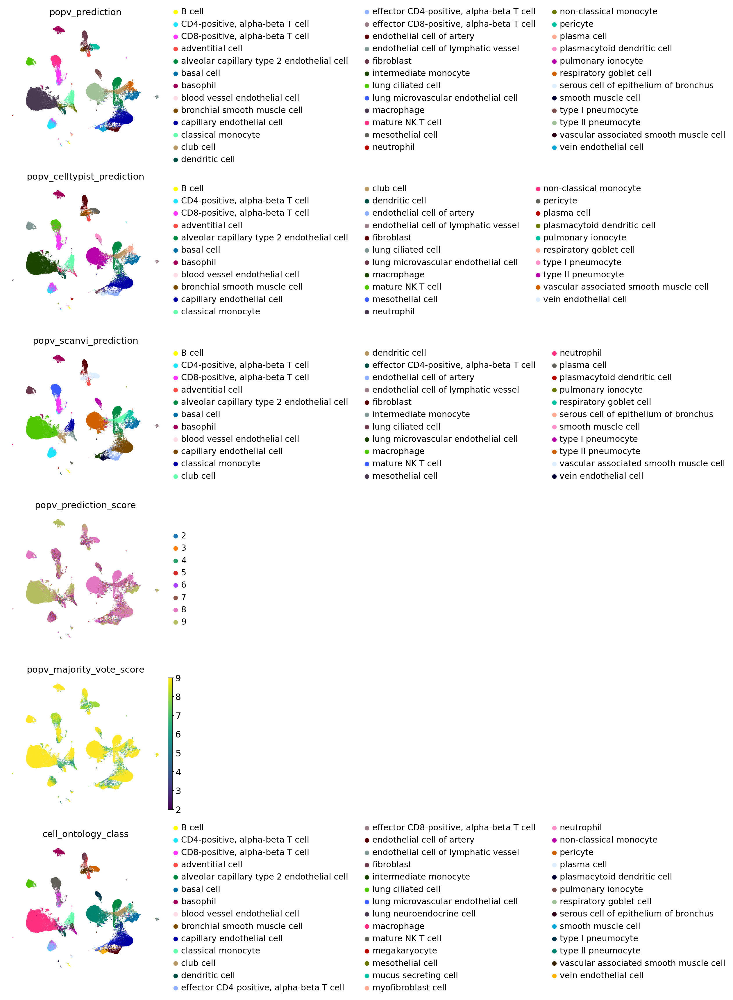

In [9]:
adata.obsm['X_umap'] = adata.obsm['X_scanvi_umap_popv']

sc.pl.umap(adata,
           color=['popv_prediction', 'popv_celltypist_prediction', 'popv_scanvi_prediction', 'popv_prediction_score', 'popv_majority_vote_score', 'cell_ontology_class'], ncols=1)

In [10]:
adata

AnnData object with n_obs × n_vars = 105322 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', 'paper_annotation', 'sample', '_dataset', '_labelled_train_indices', 'n_counts', 'over_clustering', 'popv_celltypist_prediction', 'popv_celltypist_prediction_probabilities', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_bbknn_prediction_probabilities', 'popv_knn_on_harmony_prediction', 'popv_knn_on_harmony_prediction_probabilities', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scanorama_prediction_probabilities', 'subsampled_labels', '_scvi_batch', '_scvi_labels', 'popv_knn_on_scvi_prediction', 'popv_knn_on_scvi_prediction_probabilities', '_labels_annotation_cell_ontology_id', 'popv_onclass_seen', 'popv_onclass_prediction', 'po

In [11]:
adata[adata.obs['popv_majority_vote_prediction'] != adata.obs['popv_prediction']].obs[['cell_ontology_class', 'popv_majority_vote_score', 'popv_majority_vote_prediction', 'popv_prediction', 'popv_onclass_prediction', 'popv_onclass_seen']].drop_duplicates()

,cell_ontology_class,popv_majority_vote_score,popv_majority_vote_prediction,popv_prediction,popv_onclass_prediction,popv_onclass_seen
TCCTTTCTCCCGAGTG_TSP14_Lung_Proximal_10X_1_1,"effector CD8-positive, alpha-beta T cell",4,"effector CD8-positive, alpha-beta T cell","CD4-positive, alpha-beta T cell",effector T cell,"effector CD8-positive, alpha-beta T cell"
TCGAACAAGTGATAGT_TSP14_Lung_Proximal_10X_1_1,"effector CD4-positive, alpha-beta T cell",5,"effector CD4-positive, alpha-beta T cell","CD4-positive, alpha-beta T cell",effector T cell,"effector CD4-positive, alpha-beta T cell"
TTGGGATGTAGTCCTA_TSP14_Lung_Proximal_10X_1_1,"effector CD8-positive, alpha-beta T cell",4,"effector CD8-positive, alpha-beta T cell","CD8-positive, alpha-beta T cell",effector T cell,"effector CD8-positive, alpha-beta T cell"
TGTGGCGCAGAACTTC_TSP14_Lung_Proximal_10X_1_1,type II pneumocyte,5,type II pneumocyte,type I pneumocyte,pneumocyte,type II pneumocyte
GATTTCTTCTCGTCAC_TSP14_Lung_Proximal_10X_1_1,smooth muscle cell,4,fibroblast,smooth muscle cell,enteric smooth muscle cell,smooth muscle cell
...,...,...,...,...,...,...
P3_3_AGTGGGACACAGTCGC,basal cell,5,lung ciliated cell,basal cell,ciliated cell,lung ciliated cell
P3_3_TGCACCTCATTAGGCT,pulmonary ionocyte,5,pulmonary ionocyte,basal cell,epithelial cell of lung,pulmonary ionocyte
P3_4_GATTCAGCACCTGGTG,fibroblast,4,fibroblast,smooth muscle cell,tracheobronchial smooth muscle cell,bronchial smooth muscle cell
P3_4_CATTCGCCAACTGCGC,fibroblast,4,bronchial smooth muscle cell,fibroblast,tracheobronchial smooth muscle cell,bronchial smooth muscle cell


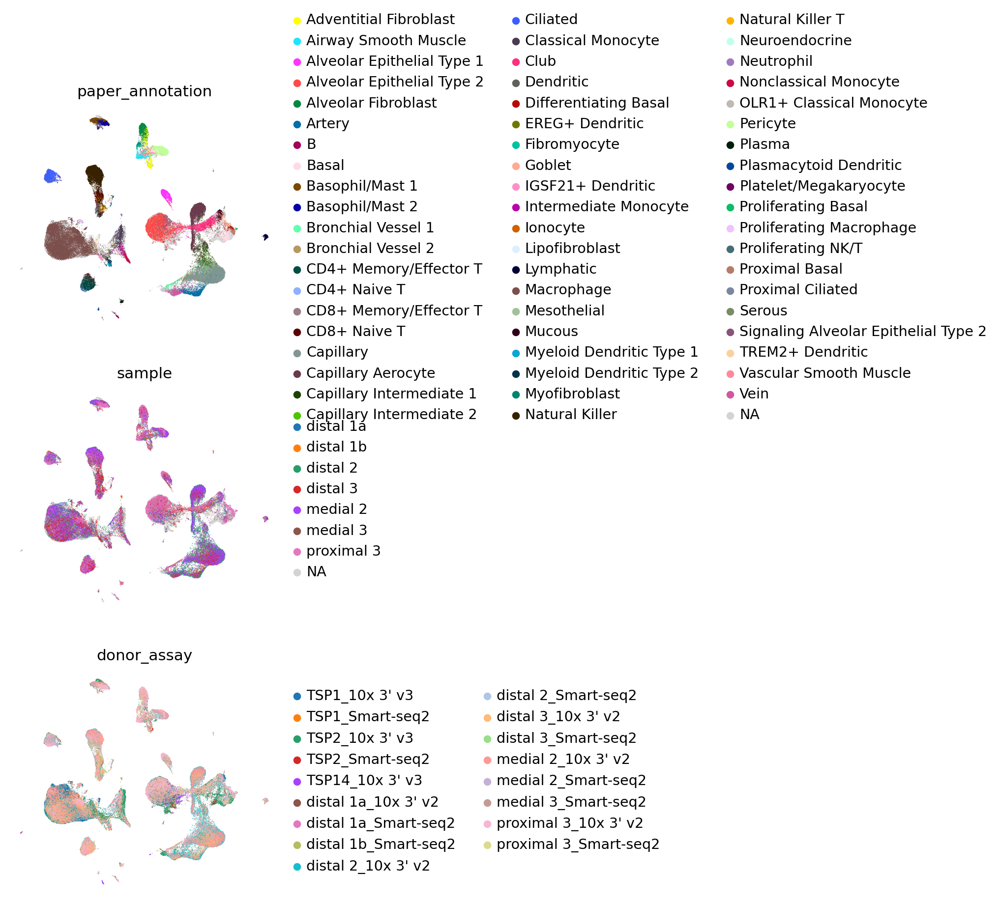

In [12]:
sc.pl.umap(
    adata, color=['paper_annotation', 'sample', 'donor_assay'], ncols=1)

# Step 6: Summary Statistics

In [13]:
adata

AnnData object with n_obs × n_vars = 105322 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', 'paper_annotation', 'sample', '_dataset', '_labelled_train_indices', 'n_counts', 'over_clustering', 'popv_celltypist_prediction', 'popv_celltypist_prediction_probabilities', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_bbknn_prediction_probabilities', 'popv_knn_on_harmony_prediction', 'popv_knn_on_harmony_prediction_probabilities', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scanorama_prediction_probabilities', 'subsampled_labels', '_scvi_batch', '_scvi_labels', 'popv_knn_on_scvi_prediction', 'popv_knn_on_scvi_prediction_probabilities', '_labels_annotation_cell_ontology_id', 'popv_onclass_seen', 'popv_onclass_prediction', 'po

Making confusion matrix for popv_prediction


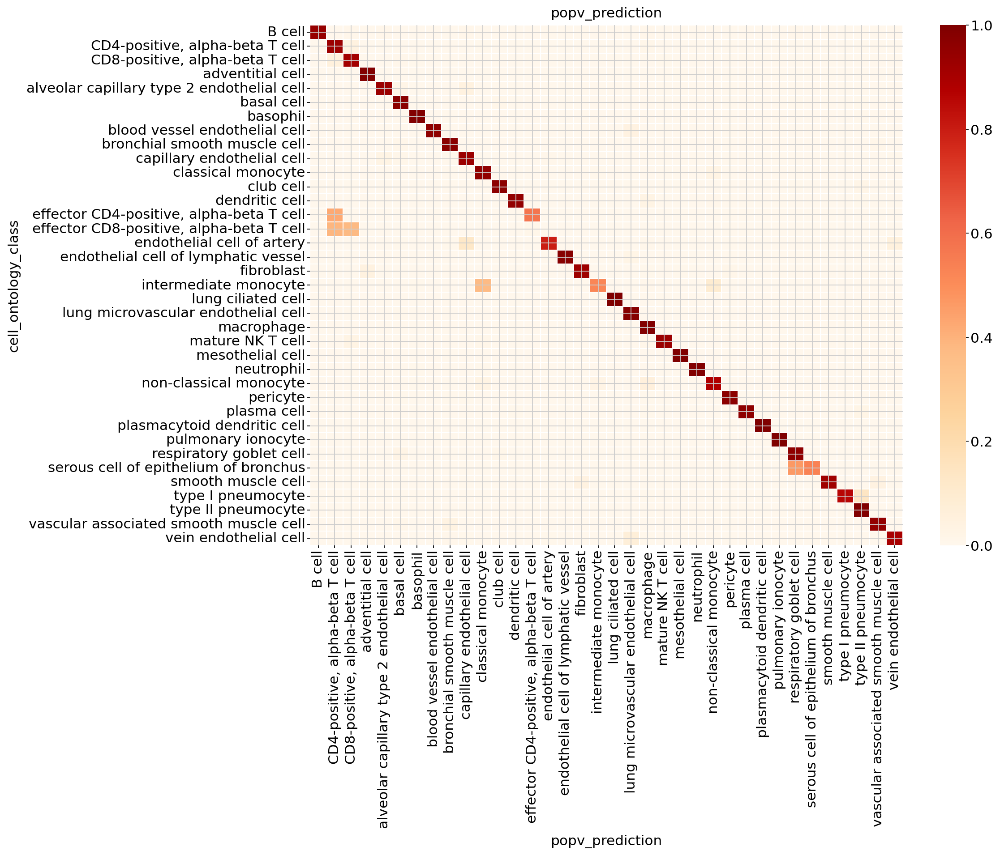

In [21]:
popv.visualization.make_agreement_plots(adata[adata.obs['_dataset']=='ref'], popv_prediction_key='cell_ontology_class', prediction_keys=['popv_prediction'])

Making confusion matrix for popv_prediction


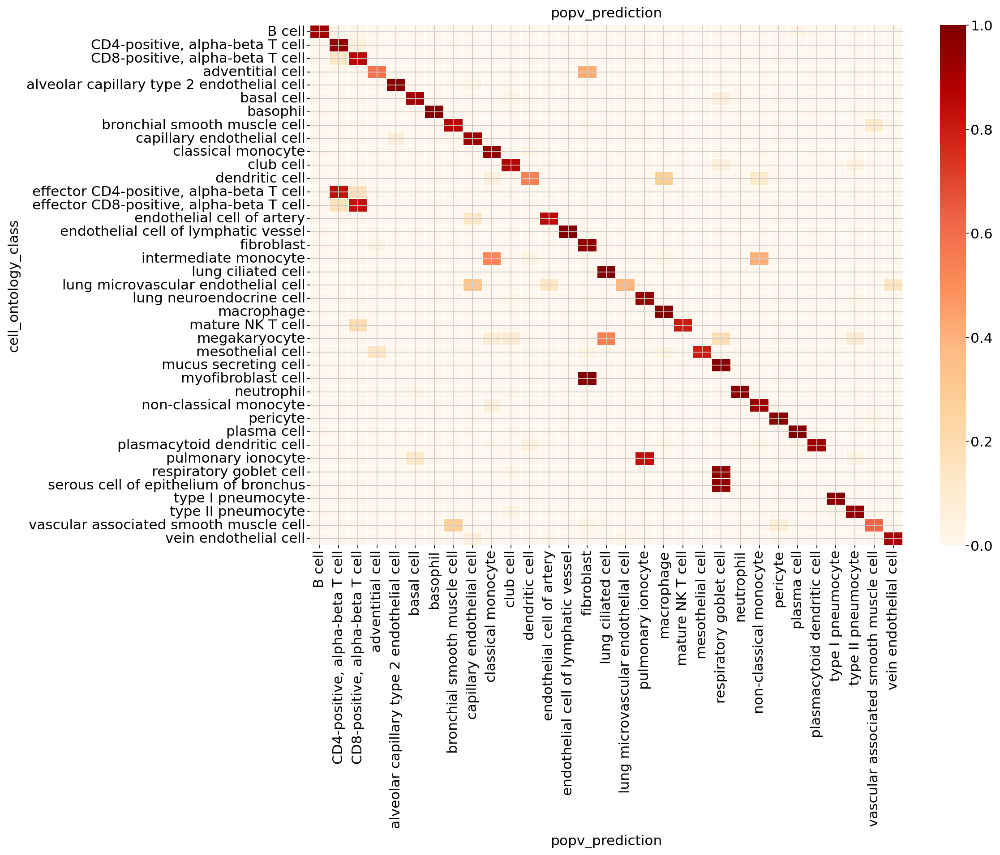

In [22]:
popv.visualization.make_agreement_plots(adata[adata.obs['_dataset']=='query'], popv_prediction_key='cell_ontology_class', prediction_keys=['popv_prediction'])

Making confusion matrix for popv_celltypist_prediction


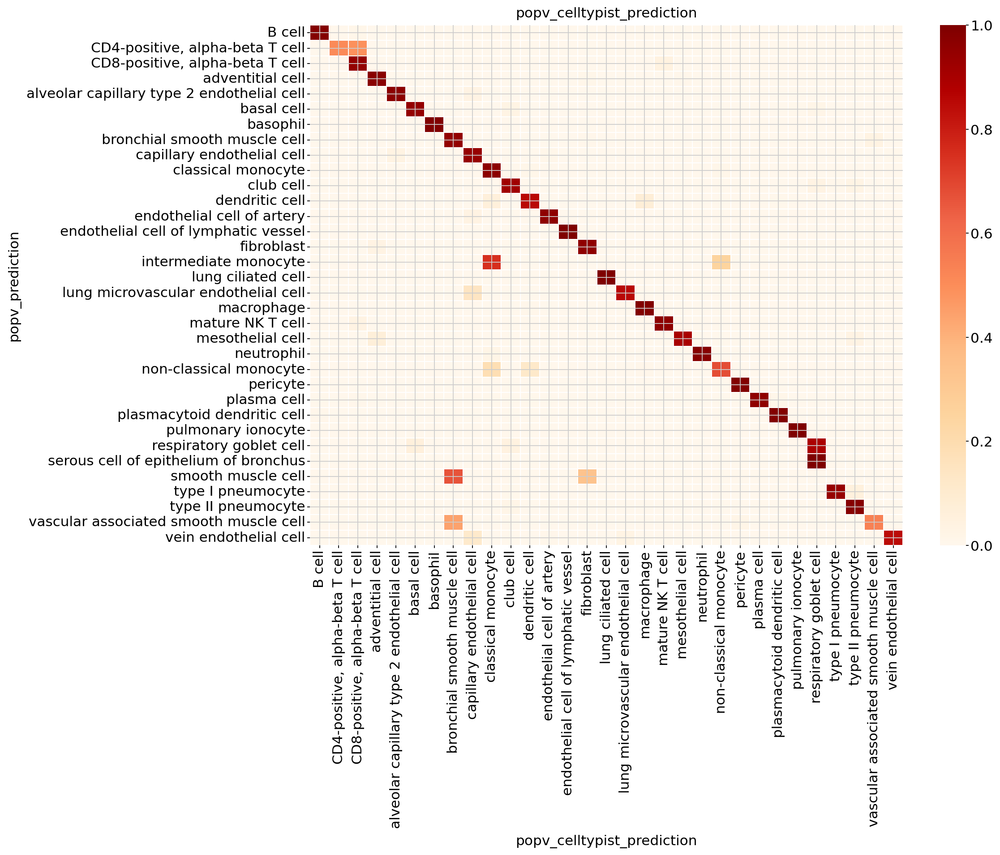

Making confusion matrix for popv_knn_on_bbknn_prediction


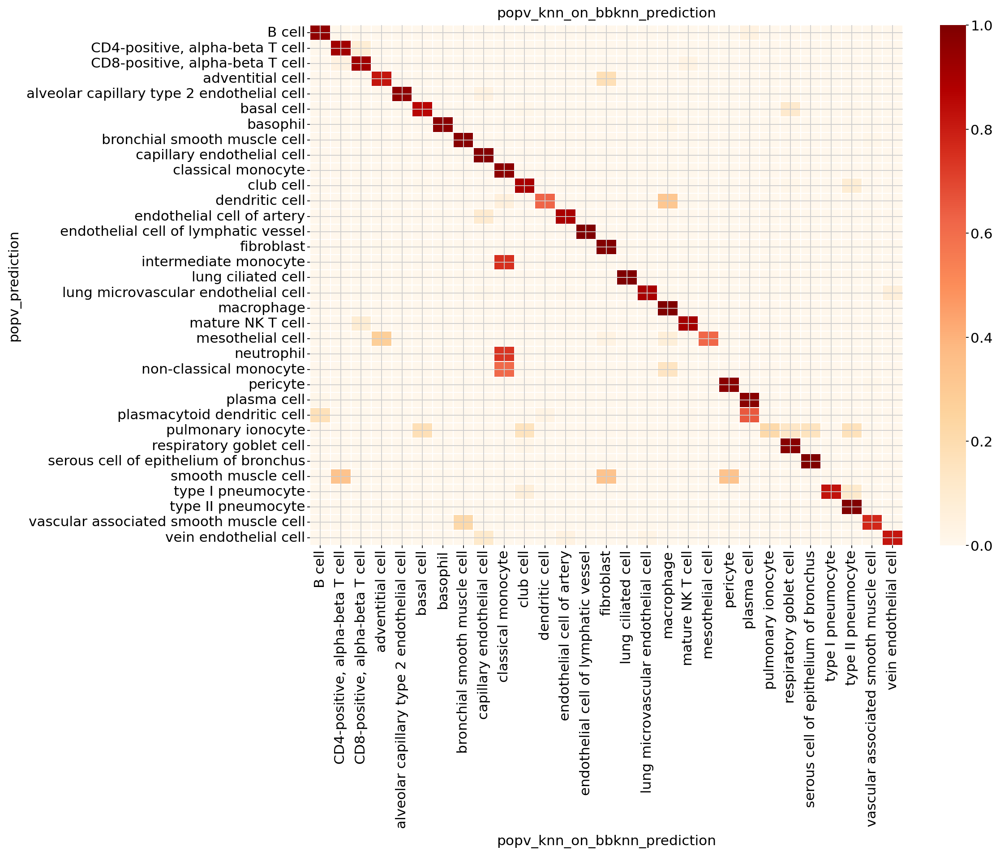

Making confusion matrix for popv_knn_on_harmony_prediction


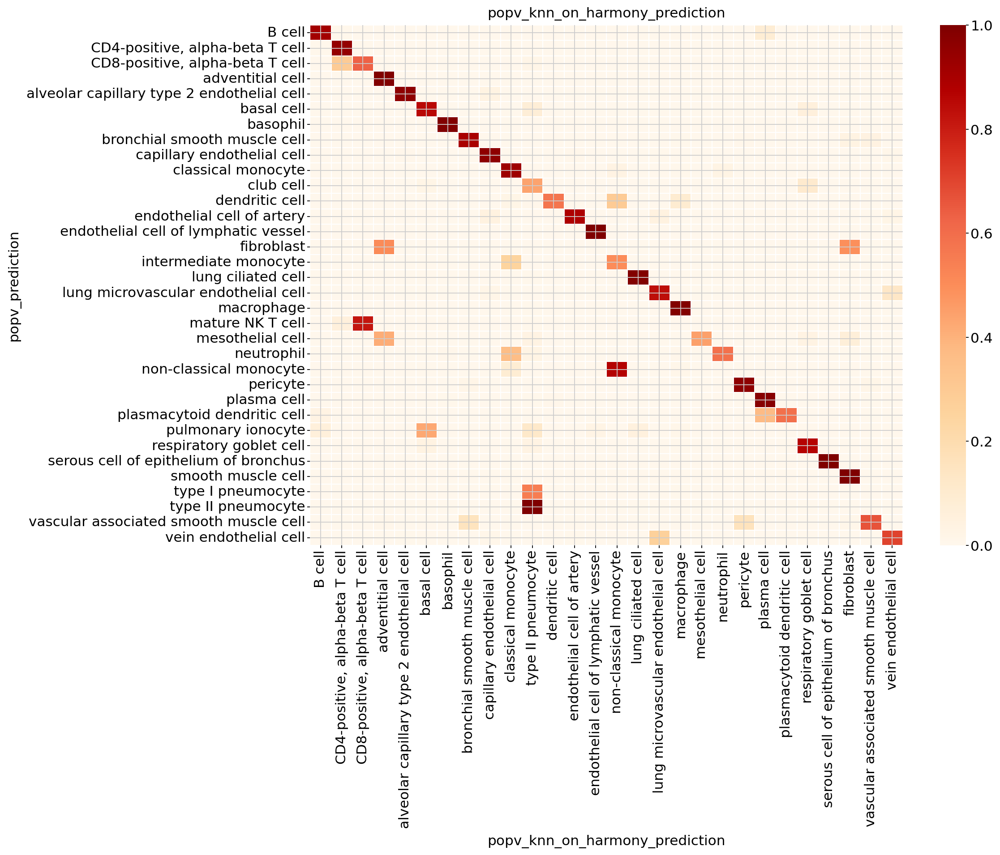

Making confusion matrix for popv_knn_on_scanorama_prediction


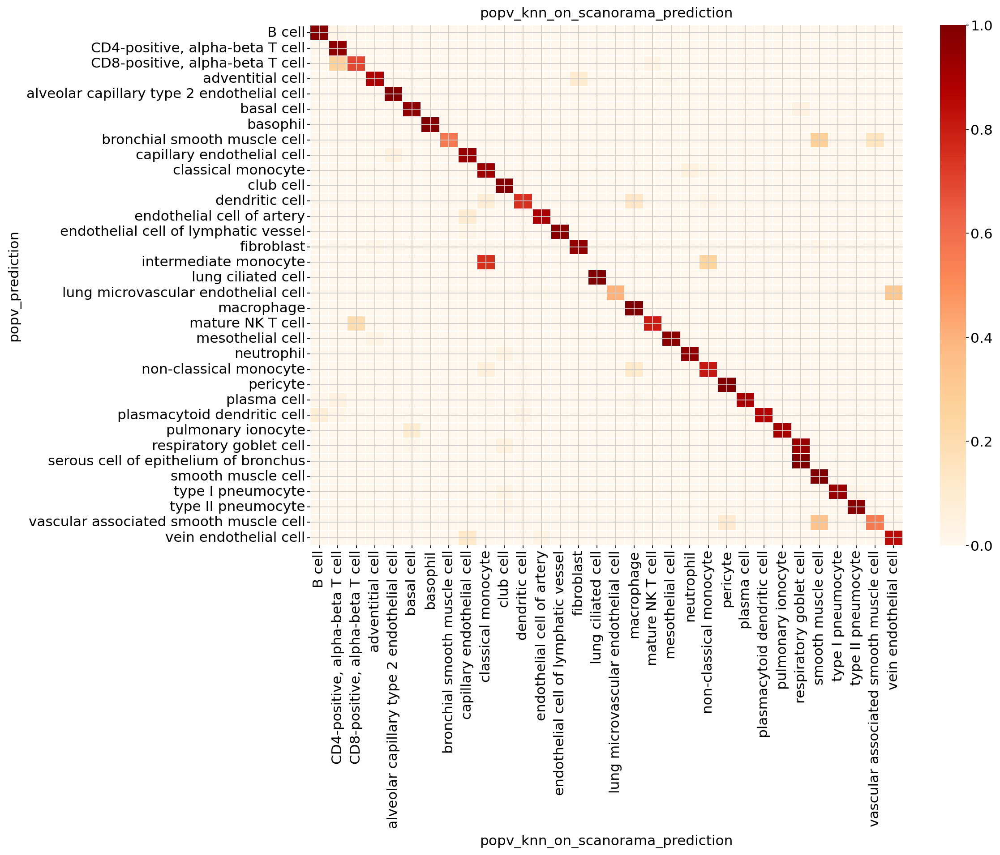

Making confusion matrix for popv_knn_on_scvi_prediction


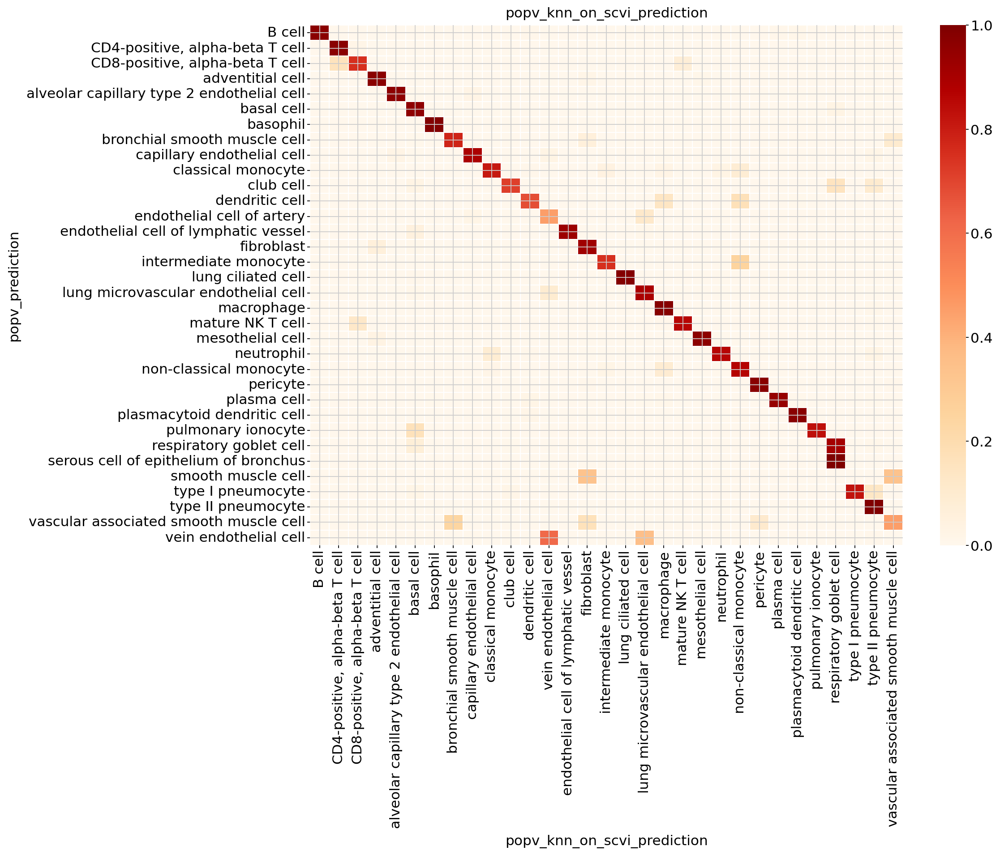

Making confusion matrix for popv_onclass_prediction


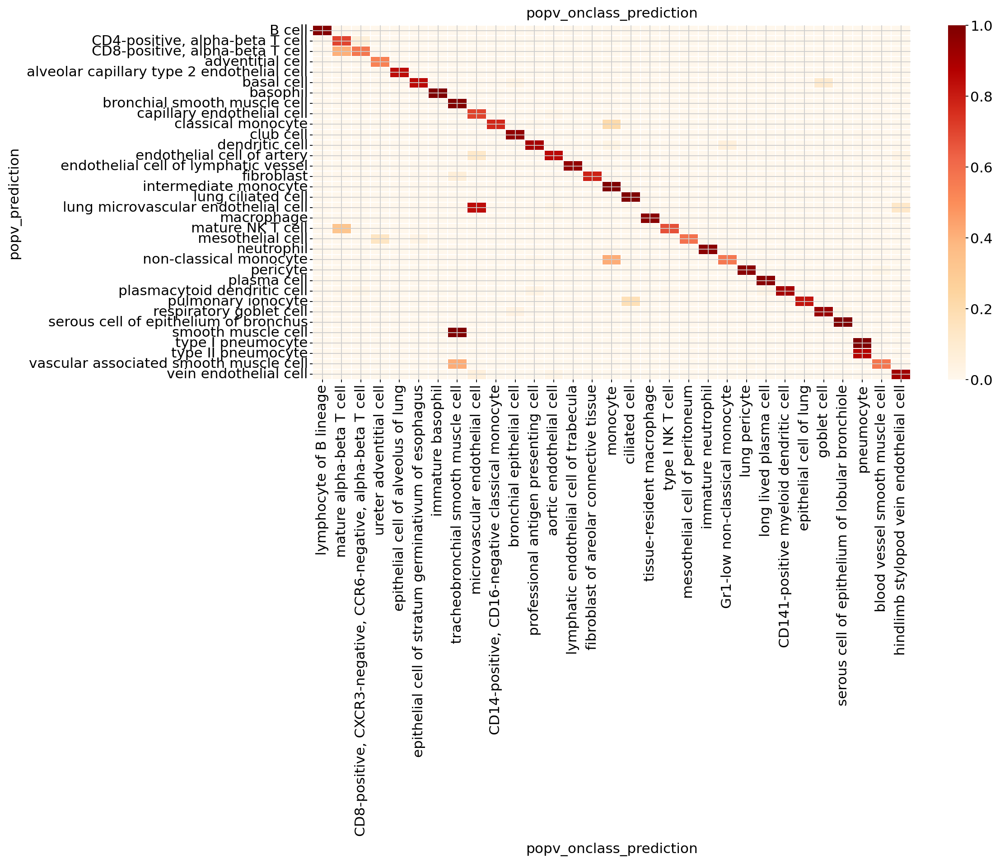

Making confusion matrix for popv_rf_prediction


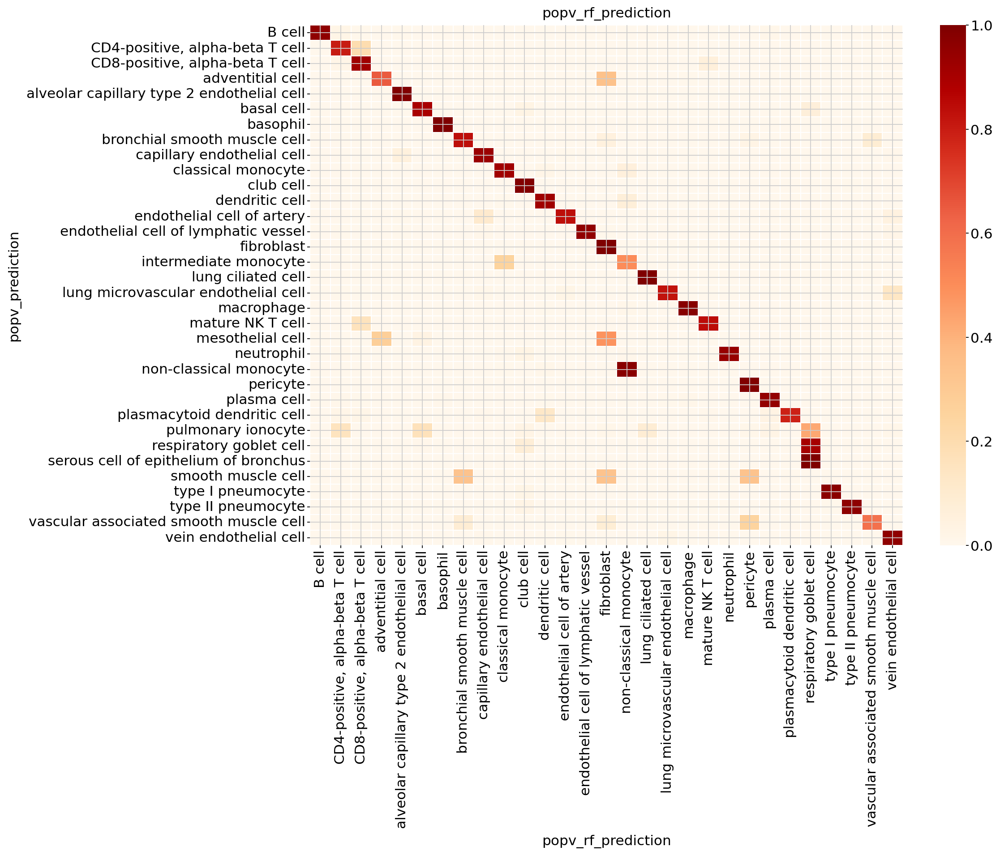

Making confusion matrix for popv_scanvi_prediction


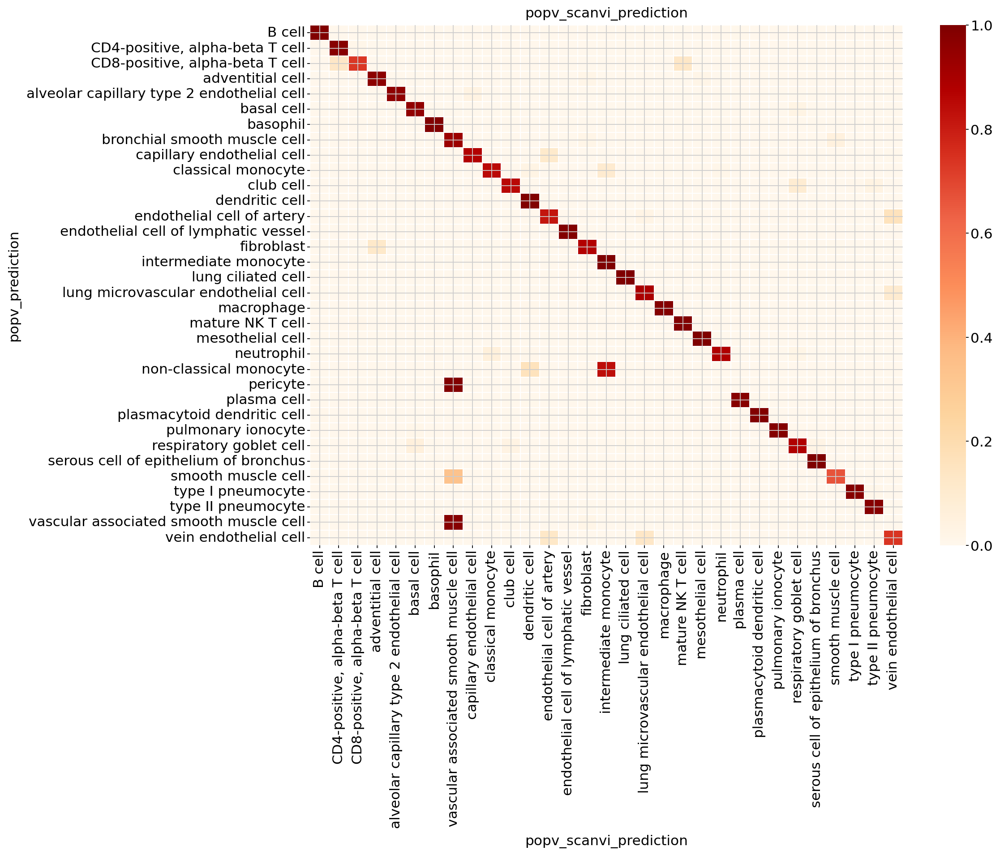

Making confusion matrix for popv_svm_prediction


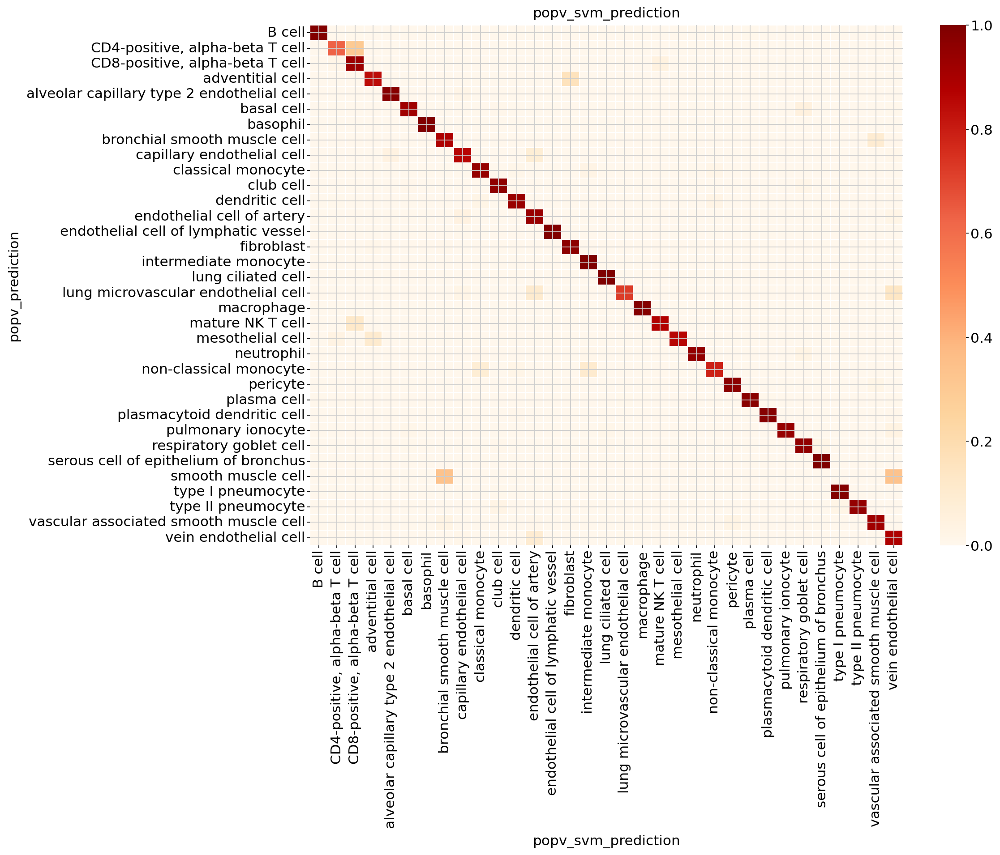

Making confusion matrix for popv_onclass_seen


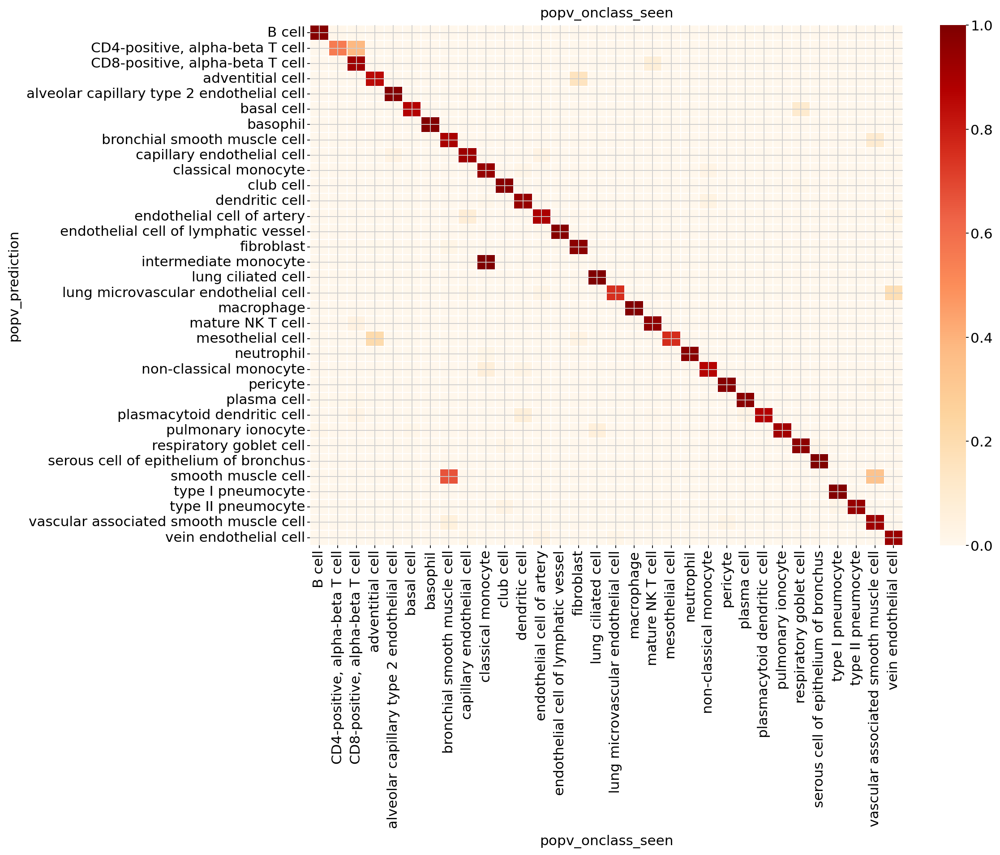

In [23]:
popv.visualization.make_agreement_plots(adata[adata.obs['_dataset']=='query'], prediction_keys=adata.uns['prediction_keys'] + ['popv_onclass_seen'])

In [24]:
adata

AnnData object with n_obs × n_vars = 105322 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', 'paper_annotation', 'sample', '_dataset', '_labelled_train_indices', 'n_counts', 'over_clustering', 'popv_celltypist_prediction', 'popv_celltypist_prediction_probabilities', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_bbknn_prediction_probabilities', 'popv_knn_on_harmony_prediction', 'popv_knn_on_harmony_prediction_probabilities', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scanorama_prediction_probabilities', 'subsampled_labels', '_scvi_batch', '_scvi_labels', 'popv_knn_on_scvi_prediction', 'popv_knn_on_scvi_prediction_probabilities', '_labels_annotation_cell_ontology_id', 'popv_onclass_seen', 'popv_onclass_prediction', 'po

<Axes: title={'center': 'PopV Prediction Score'}, xlabel='Score', ylabel='Frequency'>

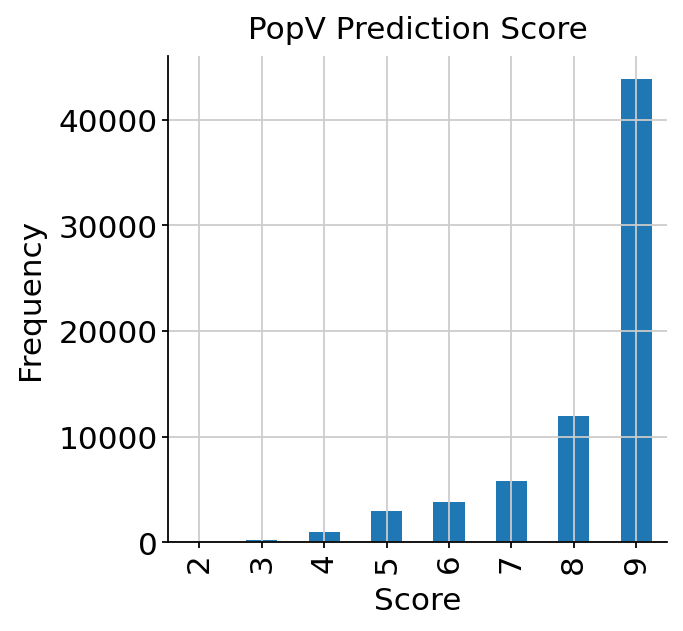

In [25]:
popv.visualization.prediction_score_bar_plot(adata, popv_prediction_score="popv_majority_vote_score")

<Axes: title={'center': 'PopV Prediction Score'}, xlabel='Score', ylabel='Frequency'>

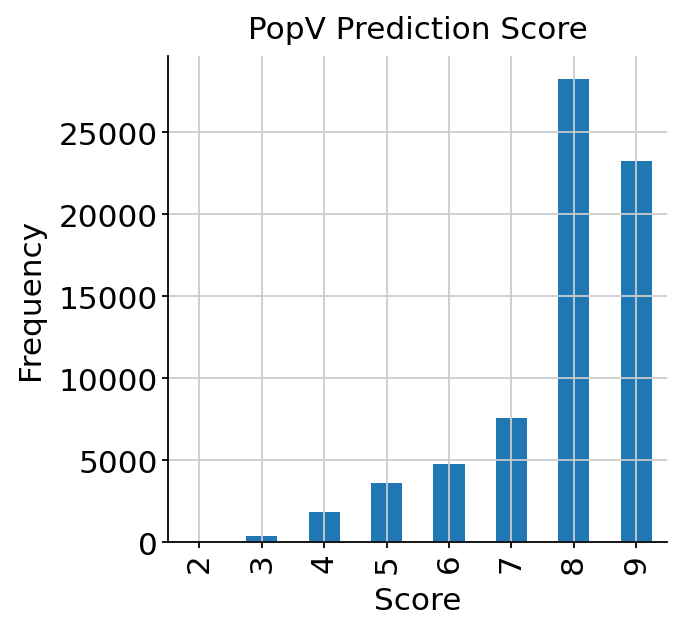

In [26]:
popv.visualization.prediction_score_bar_plot(adata, popv_prediction_score="popv_prediction_score")

In [27]:
%matplotlib inline

<Axes: ylabel='Mean Agreement'>

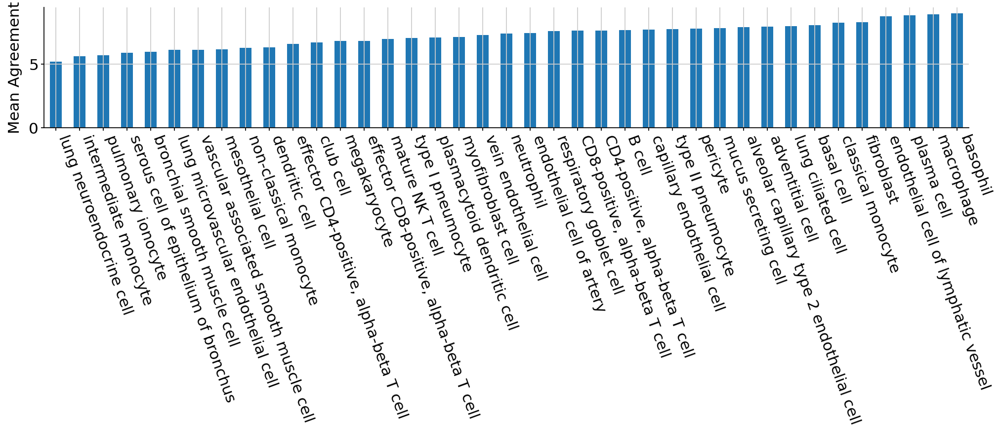

In [28]:
popv.visualization.agreement_score_bar_plot(adata, popv_prediction_key='cell_ontology_class')

<Axes: ylabel='Mean Agreement'>

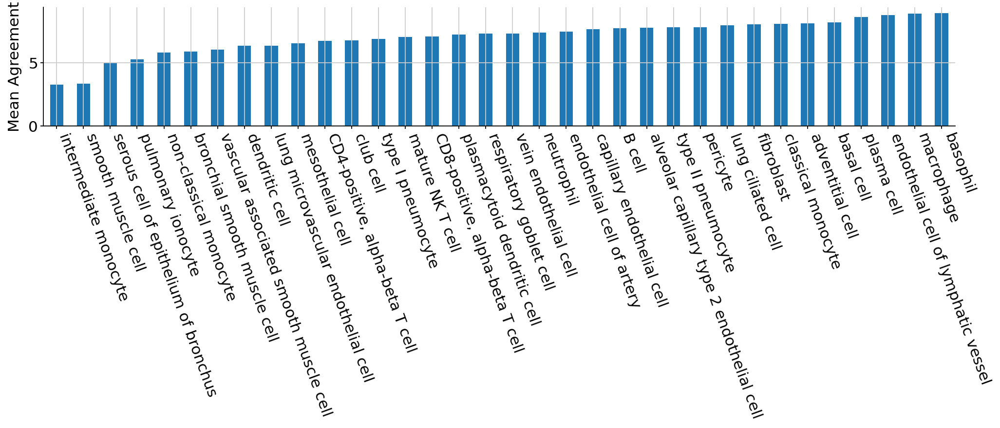

In [29]:
popv.visualization.agreement_score_bar_plot(adata)

### Cell type proportion plot

<Axes: ylabel='log Celltype Abundance'>

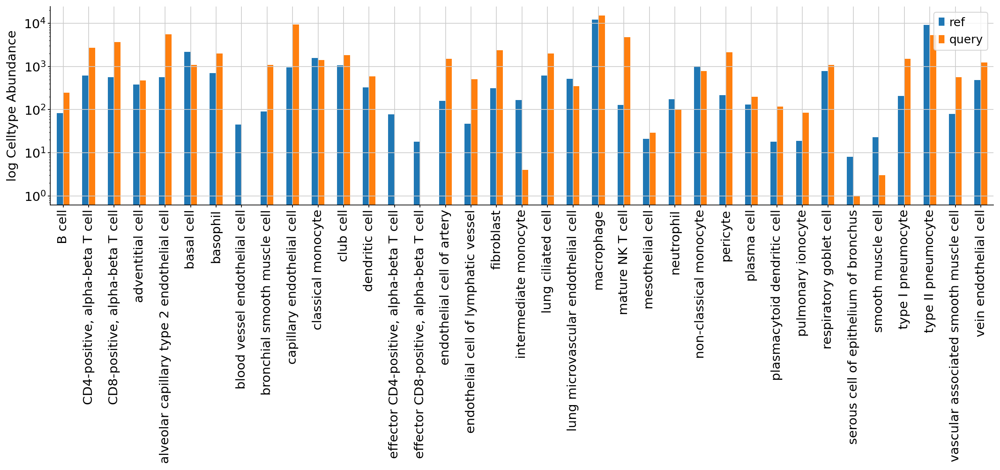

In [30]:
popv.visualization.celltype_ratio_bar_plot(adata)